****
Data
****
| Column Name          | Data Type                | Description                   |
|----------------------|--------------------------|-------------------------------|
| User id              | Integer                  | Unique user identifier        |
| Loan category        | String                   | Categorical variable          |
| Amount               | Integer                  | Loan amount                   |
| Interest Rate        | Integer                  | Interest rate                 |
| Tenure               | Integer                  | Loan tenure                   |
| Employment type      | String                   | Categorical variable          |
| Tier of Employment   | Categorical and Ordinal  | Employment tier classification|
| Industry             | Categorical              | Industry type                 |
| Role                 | Categorical              | Role description              |
| Work Experience      | Categorical and Ordinal  | Work experience category      |
| Total Income(PA)     | Integer                  | Total annual income           |
| Gender               | Categorical              | Gender of the user            |
| Married              | Categorical              | Marital status                |
| Dependents           | Integer                  | Number of dependents          |
| Home                 | Categorical              | Housing category              |
| Pincode              | Unknown                  | Pincode information           |
| Social Profile       | Categorical              | Social profile of the user    |
| Is_verified          | Categorical              | Verification status           |
| Delinq_2yrs          | Integer                  | Number of delinquencies       |
| Total Payment        | Integer                  | Total payment received        |
| Received Principal   | Integer                  | Principal amount received     |
| Interest Received    | Integer                  | Interest amount received      |
| Number of loans      | Integer                  | Number of loans taken          |
| Defaulter            | Categorical              | Loan defaulter classification |

****
**Column to be predicted "Defaulter"**

## **Data Overview**


In [298]:
import pandas as pd
import numpy as np
import os
import pandas as pd
import warnings
warnings.filterwarnings('ignore')


In [299]:
from Source.setup import *
from Source.eda import *
from Source.machine_learning import *

## **Reading and Merging Data**



In [300]:
import os
import pandas as pd

# Assuming the file name is 'your_file.xlsx'
# file_name = 'Credit_Risk_Dataset.xlsx'

# Join the folder name and file name to create the complete path
# folder_name = 'sample_data'
# path = os.path.join(folder_name, file_name)
path = '../Credit_Risk_Dataset.xlsx'


# Read Excel data
dfs = pd.read_excel(path, sheet_name=None)

# Now you can access individual sheets from the 'dfs' dictionary
loan_information = dfs['loan_information']
employment = dfs['Employment']
personal_information = dfs['Personal_information']
other_information = dfs['Other_information']


In [301]:
employment

,User id,Employmet type,Tier of Employment,Industry,Role,Work Experience,Total Income(PA)
0,7013527,Salaried,B,mLVIVxoGY7TUDJ1FyFoSIZi1SFcaBmO01AydRchaEiGYtU...,KHMbckjadbckIFGAZSEWdkcndwkcnCCM,1-2,125000.0
1,7014291,Self - Employeed,D,mLVIVxoGY7TUDJ1FyFoSIZi1SFcaBmO01AydRchaEiGYtU...,KHMbckjadbckIFGNCSEWdkcndwkcnCCM,10+,61000.0
2,7014327,NaN,NaN,mLVIVxoGY7TUDJ1FyFoSIZi1SFcaBmO01AydRchaEiGYtU...,KHMbckjadbckIFGNYSEWdkcndwkcnCCM,5-10,100000.0
3,7014304,NaN,NaN,mLVIVxoGY7TUDJ1FyFoSIZi1SFcaBmO01AydRchaEiGYtU...,KHMbckjadbckIFGCASEWdkcndwkcnCCM,2-3,30000.0
4,7031995,NaN,NaN,mLVIVxoGY7TUDJ1FyFoSIZi1SFcaBmO01AydRchaEiGYtU...,KHMbckjadbckIFGCASEWdkcndwkcnCCM,10+,65000.0
...,...,...,...,...,...,...,...
134412,55993166,NaN,NaN,0,KHMbckjadbckIFGTNSEWdkcndwkcnCCM,0,100000.0
134413,56263229,NaN,NaN,0,KHMbckjadbckIFGOHSEWdkcndwkcnCCM,0,27000.0
134414,55992716,NaN,NaN,0,KHMbckjadbckIFGCASEWdkcndwkcnCCM,0,53000.0
134415,56363313,NaN,NaN,0,KHMbckjadbckIFGVASEWdkcndwkcnCCM,0,75400.0


In [302]:
# Merge 'loan_information' and 'Employment' dataframes based on 'User_id'
merged_df = pd.merge(loan_information, employment, left_on='User_id', right_on='User id')

# Merge the previously merged dataframe with 'personal_information' based on 'User_id'
merged_df = pd.merge(merged_df, personal_information, left_on='User_id', right_on='User id')

# Merge the previously merged dataframe with 'other_information' based on 'User_id'
merged_df = pd.merge(merged_df, other_information, left_on='User_id', right_on='User_id')

df=merged_df
# Display the first few rows of the merged dataframe
df.head()

,User_id,Loan Category,Amount,Interest Rate,Tenure(years),User id_x,Employmet type,Tier of Employment,Industry,Role,...,Home,Pincode,Social Profile,Is_verified,Delinq_2yrs,Total Payement,Received Principal,Interest Received,Number of loans,Defaulter
0,7013527,Consolidation,55884.0,11.84,6,7013527,Salaried,B,mLVIVxoGY7TUDJ1FyFoSIZi1SFcaBmO01AydRchaEiGYtU...,KHMbckjadbckIFGAZSEWdkcndwkcnCCM,...,rent,XX852X,No,NaN,0,1824.150000,971.46,852.69,0,1
1,7014291,Consolidation,55511.0,16.94,4,7014291,Self - Employeed,D,mLVIVxoGY7TUDJ1FyFoSIZi1SFcaBmO01AydRchaEiGYtU...,KHMbckjadbckIFGNCSEWdkcndwkcnCCM,...,mortgage,XX286X,NaN,Source Verified,0,22912.532998,18000.00,4912.53,0,0
2,7014327,Consolidation,12289.0,11.84,6,7014327,NaN,NaN,mLVIVxoGY7TUDJ1FyFoSIZi1SFcaBmO01AydRchaEiGYtU...,KHMbckjadbckIFGNYSEWdkcndwkcnCCM,...,own,XX113X,No,NaN,0,7800.440000,4489.76,3310.68,0,1
3,7014304,Credit Card,29324.0,14.71,4,7014304,NaN,NaN,mLVIVxoGY7TUDJ1FyFoSIZi1SFcaBmO01AydRchaEiGYtU...,KHMbckjadbckIFGCASEWdkcndwkcnCCM,...,rent,XX941X,Yes,NaN,0,6672.050000,5212.29,1459.76,0,0
4,7031995,Credit Card,30252.0,14.71,4,7031995,NaN,NaN,mLVIVxoGY7TUDJ1FyFoSIZi1SFcaBmO01AydRchaEiGYtU...,KHMbckjadbckIFGCASEWdkcndwkcnCCM,...,rent,XX913X,No,Verified,0,11793.001345,10000.00,1793.00,0,0


### **Basic Statistics**

****

In [303]:
# Display data types for each column in the DataFrame. Goal is to see if there is any column with the wrong data type.
df.dtypes

User_id                 int64
Loan Category          object
Amount                float64
Interest Rate         float64
Tenure(years)           int64
User id_x               int64
Employmet type         object
Tier of Employment     object
Industry               object
Role                   object
Work Experience        object
Total Income(PA)      float64
User id_y               int64
Gender                 object
Married                object
Dependents              int64
Home                   object
Pincode                object
Social Profile         object
Is_verified            object
Delinq_2yrs             int64
Total Payement        float64
Received Principal    float64
Interest Received     float64
Number of loans         int64
Defaulter               int64
dtype: object

In [304]:
# We can use describe pandas function to learn basic statistics of all numerical columns in our data.
df.describe()

,User_id,Amount,Interest Rate,Tenure(years),User id_x,Total Income(PA),User id_y,Dependents,Delinq_2yrs,Total Payement,Received Principal,Interest Received,Number of loans,Defaulter
count,1.437270e+05,1.118030e+05,143727.000000,143727.000000,1.437270e+05,1.437270e+05,1.437270e+05,143727.000000,143727.000000,143727.000000,143727.000000,143727.000000,143727.000000,143727.000000
mean,3.733474e+07,1.376458e+05,12.038703,4.514503,3.733474e+07,7.242256e+04,3.733474e+07,1.997113,0.276601,10840.882025,8407.001538,2352.729746,0.005573,0.093712
std,3.182811e+07,1.575427e+05,3.880204,0.874241,3.182811e+07,5.539328e+04,3.182811e+07,1.411317,0.789019,8613.421536,7224.396032,2447.759754,0.098785,0.291429
min,2.080360e+05,0.000000e+00,5.420000,4.000000,2.080360e+05,4.000000e+03,2.080360e+05,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.276118e+06,2.837950e+04,9.180000,4.000000,3.276118e+06,4.500000e+04,3.276118e+06,1.000000,0.000000,4674.775000,3104.160000,841.685000,0.000000,0.000000
50%,5.766517e+07,7.660300e+04,11.840000,4.000000,5.766517e+07,6.180000e+04,5.766517e+07,2.000000,0.000000,8212.410000,6000.000000,1632.240000,0.000000,0.000000
75%,6.729174e+07,2.054645e+05,14.440000,6.000000,6.729174e+07,8.600000e+04,6.729174e+07,3.000000,0.000000,14175.769677,11664.365000,2904.770000,0.000000,0.000000
max,7.895894e+07,8.000078e+06,23.540000,6.000000,7.895894e+07,7.141778e+06,7.895894e+07,4.000000,22.000000,57777.579870,35000.010000,24205.620000,5.000000,1.000000


### **Handling Missing Values in Data**

In [305]:
# Let's check how many missing values do we have in each column in our dataframe
df.isnull().sum()

User_id                   0
Loan Category             0
Amount                31924
Interest Rate             0
Tenure(years)             0
User id_x                 0
Employmet type        84642
Tier of Employment    84642
Industry                  4
Role                      0
Work Experience           4
Total Income(PA)          0
User id_y                 0
Gender                    0
Married               48143
Dependents                0
Home                      0
Pincode                   0
Social Profile        47856
Is_verified           35803
Delinq_2yrs               0
Total Payement            0
Received Principal        0
Interest Received         0
Number of loans           0
Defaulter                 0
dtype: int64

In [306]:
# Drop rows with missing values in the 'Industry' and 'Work Experience' columns as the data in 'Industry' is meaningless due to encryption, and 'Work Experience' is inconsistent in the dataset, treating it as an object datatype variable which may impact model performance.
df = df.dropna(subset=['Industry', 'Work Experience'])

In [307]:
# Call the function to replace null values with "missing"
replace_with='missing'
columns_to_replace = ['Social Profile', 'Is_verified', 'Married', 'Employmet type']
df= replace_null_values_with_a_value(df, columns_to_replace, replace_with)

In [308]:
#Create a new variable "amount_missing" to indicate if the 'Amount' is missing or not. Assign 1 if 'Amount' is null, otherwise assign 0.
df['amount_missing'] = np.where(df['Amount'].isnull(), 1, 0)

#Replace the null values in the 'Amount' column with the value "-1000" to differentiate them from the rest of the data.
replace_with= df['Amount'].mean()
columns_to_replace = ['Amount']

df= replace_null_values_with_a_value(df, columns_to_replace,replace_with)

In [309]:
# Replace the null values in the 'Tier of Employment' column with the string "Z" to categorize them separately.
replace_with='Z'
columns_to_replace = ['Tier of Employment']

df= replace_null_values_with_a_value(df, columns_to_replace,replace_with)

In [310]:
#Check for null rows in the DataFrame to confirm if the data is clean and does not contain any missing values that could potentially impact the performance of the model.
df.isnull().sum()

User_id               0
Loan Category         0
Amount                0
Interest Rate         0
Tenure(years)         0
User id_x             0
Employmet type        0
Tier of Employment    0
Industry              0
Role                  0
Work Experience       0
Total Income(PA)      0
User id_y             0
Gender                0
Married               0
Dependents            0
Home                  0
Pincode               0
Social Profile        0
Is_verified           0
Delinq_2yrs           0
Total Payement        0
Received Principal    0
Interest Received     0
Number of loans       0
Defaulter             0
amount_missing        0
dtype: int64

### **Drop categorical columns with too many categories**

In [311]:
# Call the function to print the number of unique values in all columns
unique_values_each_column(df)

User_id : 133748
Loan Category : 7
Amount : 86157
Interest Rate : 137
Tenure(years) : 2
User id_x : 133748
Employmet type : 3
Tier of Employment : 8
Industry : 12974
Role : 46
Work Experience : 7
Total Income(PA) : 11380
User id_y : 133748
Gender : 3
Married : 3
Dependents : 5
Home : 5
Pincode : 844
Social Profile : 3
Is_verified : 4
Delinq_2yrs : 22
Total Payement  : 104199
Received Principal : 42021
Interest Received : 93859
Number of loans : 5
Defaulter : 2
amount_missing : 2


In [312]:
# Dropping Industry Column and User_IDs as it doesn't give any significant information
# Drop 'Pincode' column: Considering privacy concerns, the 'Pincode' data is encrypted. To address these concerns, it is prudent to remove the 'Pincode' column from the dataset.
columns_to_drop = ['Industry', 'User_id','User id_x','User id_y','Pincode','Role']

# Call the function to drop columns
drop_columns(df, columns_to_drop)

,Loan Category,Amount,Interest Rate,Tenure(years),Employmet type,Tier of Employment,Work Experience,Total Income(PA),Gender,Married,...,Home,Social Profile,Is_verified,Delinq_2yrs,Total Payement,Received Principal,Interest Received,Number of loans,Defaulter,amount_missing
0,Consolidation,55884.0,11.84,6,Salaried,B,1-2,125000.0,Female,Yes,...,rent,No,missing,0,1824.150000,971.46,852.69,0,1,0
1,Consolidation,55511.0,16.94,4,Self - Employeed,D,10+,61000.0,Female,No,...,mortgage,missing,Source Verified,0,22912.532998,18000.00,4912.53,0,0,0
2,Consolidation,12289.0,11.84,6,missing,Z,5-10,100000.0,Other,missing,...,own,No,missing,0,7800.440000,4489.76,3310.68,0,1,0
3,Credit Card,29324.0,14.71,4,missing,Z,2-3,30000.0,Male,missing,...,rent,Yes,missing,0,6672.050000,5212.29,1459.76,0,0,0
4,Credit Card,30252.0,14.71,4,missing,Z,10+,65000.0,Male,missing,...,rent,No,Verified,0,11793.001345,10000.00,1793.00,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
143722,Credit Card,287564.0,12.06,6,missing,Z,0,100000.0,Female,No,...,mortgage,missing,Source Verified,1,12842.400000,7193.83,5648.57,0,0,0
143723,Other,49612.0,14.10,4,missing,Z,0,27000.0,Male,Yes,...,rent,No,Source Verified,0,839.200000,581.67,257.53,0,0,0
143724,Consolidation,13632.0,18.96,6,missing,Z,0,53000.0,Female,Yes,...,rent,missing,missing,0,6085.800000,2434.49,3651.31,0,0,0
143725,Home,186923.0,8.28,4,missing,Z,0,75400.0,Other,No,...,mortgage,missing,Source Verified,0,4080.640000,3286.82,793.82,0,0,0


### **Multicollinearity**

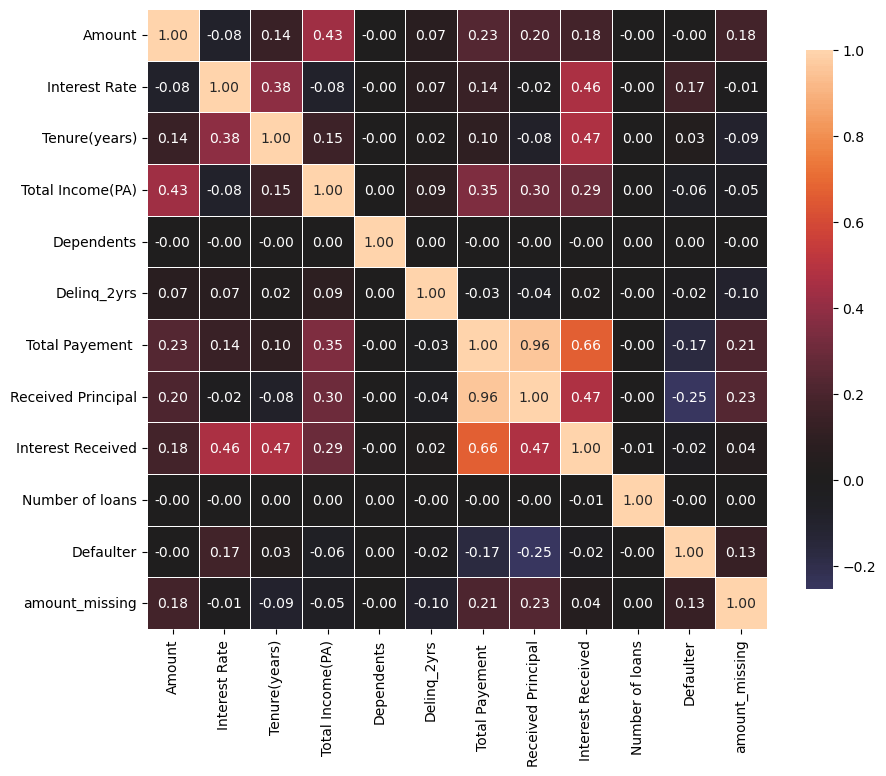

In [313]:
# Multicollinarity is the occurrence of high intercorrelations among two or more independent variables in a multiple regression mode

correlation_heatmap(df.select_dtypes(include=['number'])) # dropping non-numeric attributes

### **Skewness**

#### **Understand Skewness**

In [1]:
# To identify anomalies in each column, it is essential to examine the distributions of the variables in the dataset.
# Call the function to plot histograms
# Feature_Distributions_Histogram(df)

#### **Fixing Skewness in the Data**

**Let's print skewness in each feature and use log transformation to fix skewness.**

**Note**

It is important to note that there are numerous features in the dataset with a value of 0. To address this issue and normalize the data, we can apply a log transformation specifically to the non-zero values. By taking the logarithm of these values, we can achieve a more symmetric distribution and reduce the impact of extreme values. This transformation can be particularly useful when working with skewed data or variables that exhibit a wide range of values.

Let's only transform features if skewness is in the following range
* **Skewness < -3 OR Skewness > 3**


In [337]:
# Add all the features to check and fix skewness in features_log array
features_log= ['Amount','Interest Rate','Tenure(years)','Dependents','Total Payement ','Received Principal','Interest Received']

df= fix_skewness(df, features_log)


Inital skewness in feature:  Amount  is:  -0.8604674406011099
Inital skewness in feature:  Interest Rate  is:  0.3570183681924867
Inital skewness in feature:  Tenure(years)  is:  1.1107257129630685
Inital skewness in feature:  Dependents  is:  0.0009324906324210842
Inital skewness in feature:  Total Payement   is:  1.56758246496732
Inital skewness in feature:  Received Principal  is:  1.5217975693302837
Inital skewness in feature:  Interest Received  is:  2.8360693754096626


In [339]:
Feature_Distributions_Histogram(pd.DataFrame(df['Interest Received']))

In [346]:
def fix_skewness_2(df, features):
  features_log = features
  for f in features_log:
    sk= df[f].skew()
    print("Inital skewness in feature: ",f," is: ", sk)

    if sk>1 or sk< -1:

      Log_Fare = df[f].map(lambda i: np.log(i) if i > 0 else 0)
      df[f]=Log_Fare
      print("Final skewness in feature: ",f," is: ", Log_Fare.skew())
      fig = px.histogram(Log_Fare, x=f)
      fig.show()
  
  return df

df2= fix_skewness_2(df, ['Interest Received'])
Feature_Distributions_Histogram(pd.DataFrame(df2['Interest Received']))

Inital skewness in feature:  Interest Received  is:  -0.7787271720861234


### **One Hot Encoding of Categorical Features and Ordinal Encoding of Ordinal Features**




#### **Categorical Hot-Encoding**

In [317]:
import pandas as pd

# Add all categorical features for categorical one-hot encoding in categorical_features array
data = df
categorical_features= ["Gender", "Married", "Home", "Social Profile", "Loan Category", "Employmet type", "Is_verified"]

# Perform one-hot encoding using pandas get_dummies() function
encoded_data = pd.get_dummies(data, columns=categorical_features)

In [318]:
print(df[ordinal_features].dtypes)

Tier of Employment    object
Work Experience       object
dtype: object


#### **Ordinal Encoding**

In [319]:
def perform_ordinal_encoding(data, ordinal_features, custom_mapping):
    # Create a copy to avoid changing the original DataFrame directly
    data_copy = data.copy()

    # Initialize the encoder with custom mapping
    encoder = OrdinalEncoder(
        categories=custom_mapping,
        handle_unknown='use_encoded_value',
        unknown_value=-1  # Adjust as per your needs
    )

    # Ensure all ordinal features have valid values (optional filling)
    data_copy[ordinal_features] = data_copy[ordinal_features].fillna('Unknown')

    # Perform the encoding
    encoded_values = encoder.fit_transform(data_copy[ordinal_features])

    # Create a DataFrame for the encoded columns
    encoded_df = pd.DataFrame(encoded_values, columns=ordinal_features, index=data_copy.index)

    # Return only the encoded DataFrame
    return encoded_df

In [320]:
# Define the ordinal categorical features array
ordinal_features = ["Tier of Employment", "Work Experience"]

# Define the pandas DataFrame for encoding
data = df[ordinal_features]

# Create a custom mapping of categories to numerical labels
tier_employment_order= list(encoded_data["Tier of Employment"].unique())
tier_employment_order.sort()

work_experience_order= ['0', '<1', '1-2', '2-3', '3-5', '5-10','10+']

custom_mapping = [tier_employment_order, work_experience_order]

# Call the function to perform ordinal encoding
# data = perform_ordinal_encoding(data, ordinal_features, custom_mapping)

encoded_df = perform_ordinal_encoding(data, ordinal_features, custom_mapping)

data = df.drop(columns=ordinal_features).join(encoded_df)

In [321]:
data

,Loan Category,Amount,Interest Rate,Tenure(years),Employmet type,Total Income(PA),Gender,Married,Dependents,Home,...,Is_verified,Delinq_2yrs,Total Payement,Received Principal,Interest Received,Number of loans,Defaulter,amount_missing,Tier of Employment,Work Experience
0,Consolidation,10.931033,11.84,6,Salaried,125000.0,Female,Yes,4,rent,...,missing,0,1824.150000,971.46,852.69,0,1,0,1.0,2.0
1,Consolidation,10.924336,16.94,4,Self - Employeed,61000.0,Female,No,1,mortgage,...,Source Verified,0,22912.532998,18000.00,4912.53,0,0,0,3.0,6.0
2,Consolidation,9.416460,11.84,6,missing,100000.0,Other,missing,3,own,...,missing,0,7800.440000,4489.76,3310.68,0,1,0,7.0,5.0
3,Credit Card,10.286162,14.71,4,missing,30000.0,Male,missing,1,rent,...,missing,0,6672.050000,5212.29,1459.76,0,0,0,7.0,3.0
4,Credit Card,10.317318,14.71,4,missing,65000.0,Male,missing,3,rent,...,Verified,0,11793.001345,10000.00,1793.00,0,0,0,7.0,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
143722,Credit Card,12.569201,12.06,6,missing,100000.0,Female,No,2,mortgage,...,Source Verified,1,12842.400000,7193.83,5648.57,0,0,0,7.0,-1.0
143723,Other,10.811988,14.10,4,missing,27000.0,Male,Yes,3,rent,...,Source Verified,0,839.200000,581.67,257.53,0,0,0,7.0,-1.0
143724,Consolidation,9.520175,18.96,6,missing,53000.0,Female,Yes,2,rent,...,missing,0,6085.800000,2434.49,3651.31,0,0,0,7.0,-1.0
143725,Home,12.138452,8.28,4,missing,75400.0,Other,No,0,mortgage,...,Source Verified,0,4080.640000,3286.82,793.82,0,0,0,7.0,-1.0


### **Fix data imbalance in the target variable**

**Oversampling**

 Increase the number of instances in the minority class (defaulters) by duplicating existing examples or generating synthetic examples to achieve a balanced dataset.

In [322]:
# Specify the name of the target variable column
target_column="Defaulter"

X, y= fix_imbalance_using_oversamping(data, target_column)


In [323]:
df

,Loan Category,Amount,Interest Rate,Tenure(years),Employmet type,Tier of Employment,Work Experience,Total Income(PA),Gender,Married,...,Home,Social Profile,Is_verified,Delinq_2yrs,Total Payement,Received Principal,Interest Received,Number of loans,Defaulter,amount_missing
0,Consolidation,10.931033,11.84,6,Salaried,B,1-2,125000.0,Female,Yes,...,rent,No,missing,0,1824.150000,971.46,852.69,0,1,0
1,Consolidation,10.924336,16.94,4,Self - Employeed,D,10+,61000.0,Female,No,...,mortgage,missing,Source Verified,0,22912.532998,18000.00,4912.53,0,0,0
2,Consolidation,9.416460,11.84,6,missing,Z,5-10,100000.0,Other,missing,...,own,No,missing,0,7800.440000,4489.76,3310.68,0,1,0
3,Credit Card,10.286162,14.71,4,missing,Z,2-3,30000.0,Male,missing,...,rent,Yes,missing,0,6672.050000,5212.29,1459.76,0,0,0
4,Credit Card,10.317318,14.71,4,missing,Z,10+,65000.0,Male,missing,...,rent,No,Verified,0,11793.001345,10000.00,1793.00,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
143722,Credit Card,12.569201,12.06,6,missing,Z,0,100000.0,Female,No,...,mortgage,missing,Source Verified,1,12842.400000,7193.83,5648.57,0,0,0
143723,Other,10.811988,14.10,4,missing,Z,0,27000.0,Male,Yes,...,rent,No,Source Verified,0,839.200000,581.67,257.53,0,0,0
143724,Consolidation,9.520175,18.96,6,missing,Z,0,53000.0,Female,Yes,...,rent,missing,missing,0,6085.800000,2434.49,3651.31,0,0,0
143725,Home,12.138452,8.28,4,missing,Z,0,75400.0,Other,No,...,mortgage,missing,Source Verified,0,4080.640000,3286.82,793.82,0,0,0


In [324]:
# Example of one-hot encoding with pandas
categorical_features = ["Gender", "Married", "Home", "Social Profile", "Loan Category", "Employmet type", "Is_verified"]
df_encoded = pd.get_dummies(data, columns=categorical_features)

# Assuming 'target' is your target variable name
X = df_encoded.drop(columns=['Defaulter']).values
y = df_encoded['Defaulter'].values

# Ensure that y is 1D
y = y.ravel()


In [325]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder

def encode_categorical_columns(data):
    # Identify columns with object or category data types, and mixed numeric-string columns
    non_numeric_columns = data.select_dtypes(include=['object', 'category']).columns

    # Initialize a dictionary to hold encoders for future use
    label_encoders = {}

    # Convert all data to string for uniform encoding
    data[non_numeric_columns] = data[non_numeric_columns].astype(str)

    # Apply LabelEncoder for each non-numeric column
    for col in non_numeric_columns:
        encoder = LabelEncoder()
        data[col] = encoder.fit_transform(data[col])
        label_encoders[col] = encoder  # Store the encoder for potential reverse transformation

    return data, label_encoders

# Example usage:
# Assuming `df` is your original DataFrame containing features and a target column
df_cleaned, encoders = encode_categorical_columns(df)

# Ensure the DataFrame is now numerical
print("Data types after encoding:")
print(df_cleaned.dtypes)


Data types after encoding:
Loan Category           int64
Amount                float64
Interest Rate         float64
Tenure(years)           int64
Employmet type          int64
Tier of Employment      int64
Work Experience         int64
Total Income(PA)      float64
Gender                  int64
Married                 int64
Dependents              int64
Home                    int64
Social Profile          int64
Is_verified             int64
Delinq_2yrs             int64
Total Payement        float64
Received Principal    float64
Interest Received     float64
Number of loans         int64
Defaulter               int64
amount_missing          int64
dtype: object


In [326]:
df_cleaned

,Loan Category,Amount,Interest Rate,Tenure(years),Employmet type,Tier of Employment,Work Experience,Total Income(PA),Gender,Married,...,Home,Social Profile,Is_verified,Delinq_2yrs,Total Payement,Received Principal,Interest Received,Number of loans,Defaulter,amount_missing
0,2,10.931033,11.84,6,0,1,1,125000.0,0,1,...,4,0,3,0,1824.150000,971.46,852.69,0,1,0
1,2,10.924336,16.94,4,1,3,2,61000.0,0,0,...,0,2,1,0,22912.532998,18000.00,4912.53,0,0,0
2,2,9.416460,11.84,6,2,7,5,100000.0,2,2,...,3,0,3,0,7800.440000,4489.76,3310.68,0,1,0
3,3,10.286162,14.71,4,2,7,3,30000.0,1,2,...,4,1,3,0,6672.050000,5212.29,1459.76,0,0,0
4,3,10.317318,14.71,4,2,7,2,65000.0,1,2,...,4,0,2,0,11793.001345,10000.00,1793.00,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
143722,3,12.569201,12.06,6,2,7,0,100000.0,0,0,...,0,2,1,1,12842.400000,7193.83,5648.57,0,0,0
143723,6,10.811988,14.10,4,2,7,0,27000.0,1,1,...,4,0,1,0,839.200000,581.67,257.53,0,0,0
143724,2,9.520175,18.96,6,2,7,0,53000.0,0,1,...,4,2,3,0,6085.800000,2434.49,3651.31,0,0,0
143725,4,12.138452,8.28,4,2,7,0,75400.0,2,0,...,0,2,1,0,4080.640000,3286.82,793.82,0,0,0


In [327]:
import pandas as pd
from imblearn.over_sampling import SMOTE

# Assuming you have your pandas DataFrame df with features and target variable

# Separate the features (X) and target variable (y) from the DataFrame
X = df_cleaned.drop('Defaulter', axis=1)
y = df_cleaned['Defaulter']

# Initialize the SMOTE oversampling algorithm
smote = SMOTE(random_state=42)

# Convert X and y to NumPy arrays
X_array = X.values
y_array = y.values

# Perform oversampling on the data
X_resampled, y_resampled = smote.fit_resample(X_array, y_array)

# Convert the resampled arrays back to a pandas DataFrame
X_resampled_df = pd.DataFrame(X_resampled, columns=X.columns)
y_resampled_df = pd.DataFrame(y_resampled, columns=['Defaulter'])

# Print the class distribution before and after oversampling
print("Class distribution before oversampling:")
print(y.value_counts())

print("Class distribution after oversampling:")
print(y_resampled_df['Defaulter'].value_counts())

X = X_resampled_df
y = y_resampled_df


Class distribution before oversampling:
Defaulter
0    130254
1     13469
Name: count, dtype: int64
Class distribution after oversampling:
Defaulter
1    130254
0    130254
Name: count, dtype: int64


## **Split Data in training, validation, and testing datasets**

In [328]:
from sklearn.model_selection import train_test_split

train_x, test_x, train_y, test_y = train_test_split(X, y, test_size=0.2, random_state=42)
#val_x, test_x, val_y, test_y = train_test_split(test_x, test_xy, test_size=0.5, random_state=42)


## **Model Training: Xgboost**

### **Import packages**

In [329]:
import numpy as np
import xgboost as xgb
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
import time
from hyperopt import fmin, tpe, hp, STATUS_OK
from hyperopt.pyll import scope
import neptune
from neptune.integrations.xgboost import NeptuneCallback


import pickle
from sklearn.metrics import classification_report, confusion_matrix

In [330]:
import neptune
run = neptune.init_run(
    project="noam.smilovich/CMPE266",
    api_token="eyJhcGlfYWRkcmVzcyI6Imh0dHBzOi8vYXBwLm5lcHR1bmUuYWkiLCJhcGlfdXJsIjoiaHR0cHM6Ly9hcHAubmVwdHVuZS5haSIsImFwaV9rZXkiOiI1MTBkMWYxMi1lMjI4LTQ5ZjAtYWMzZS03YjU2MThmMDc0ZWQifQ==",
) 
neptune_callback = NeptuneCallback(run=run, log_tree=[0, 1, 2, 3])


[neptune] [info   ] Neptune initialized. Open in the app: https://app.neptune.ai/noam.smilovich/CMPE266/e/CMPE-3


### **Model training with hyperopt**

**XGBoost hyperparameters**
***
- **Boosting hyperparameters:** Control the gradient descent process in boosting.

- **Tree hyperparameters:** Influence the construction of decision trees.

- **Stochastic hyperparameters:** Determine the subsampling of training data during model building.

- **Regularization hyperparameters:** Regulate model complexity to prevent overfitting.
***

In [331]:
# Define search space for hyperparameter tuning of XGBoost model.
search_space = {
    'learning_rate': hp.loguniform('learning_rate', -7, 0),
    'max_depth': scope.int(hp.uniform('max_depth', 1, 100)),
    'min_child_weight': hp.loguniform('min_child_weight', -2, 3),
    'subsample': hp.uniform('subsample', 0.5, 1),
    'colsample_bytree': hp.uniform('colsample_bytree', 0.5, 1),
    'gamma': hp.loguniform('gamma', -10, 10),
    'alpha': hp.loguniform('alpha', -10, 10),
    'lambda': hp.loguniform('lambda', -10, 10),
    'objective': 'binary:logistic',
    'eval_metric': 'error',
    'seed': 123,
}
train_x=train_x
train_y=train_y
test_x=test_x
test_y=test_y


# Finding the best hyperparameters using Hyperopt's fmin function.
best_params = fmin(
    fn=lambda params: train_model_xgboost(params, neptune_callback, train_x, train_y, test_x, test_y),
    space=search_space,
    algo=tpe.suggest,
    max_evals=15,
    rstate=np.random.default_rng(123)
)
run.stop()

# Let's print the params
print(best_params)

# Rest of the code remains the same


100%|██████████| 15/15 [00:12<00:00,  1.18trial/s, best loss: 0.01575755249318644]
[neptune] [info   ] Shutting down background jobs, please wait a moment...
[neptune] [info   ] Done!
[neptune] [info   ] Waiting for the remaining 275 operations to synchronize with Neptune. Do not kill this process.
[neptune] [info   ] All 275 operations synced, thanks for waiting!
[neptune] [info   ] Explore the metadata in the Neptune app: https://app.neptune.ai/noam.smilovich/CMPE266/e/CMPE-3/metadata
{'alpha': 10097.8429974375, 'colsample_bytree': 0.9941458252246209, 'gamma': 4995.254471659089, 'lambda': 6.390134508060656e-05, 'learning_rate': 0.09100767117912448, 'max_depth': 29.65059937692005, 'min_child_weight': 0.1765314436877681, 'subsample': 0.6246406667012787}


### **Best fit xgboost model**


In [332]:
# Access the best hyperparameters
best_hyperparams = {k: best_params[k] for k in best_params}

# Train the final XGBoost model with the best hyperparameters
final_model = xgb.XGBClassifier(
    max_depth=int(best_hyperparams['max_depth']),
    learning_rate=best_hyperparams['learning_rate'],
    gamma=best_hyperparams['gamma'],
    subsample=best_hyperparams['subsample'],
    colsample_bytree=best_hyperparams['colsample_bytree'],
    random_state=42,
    tree_method='hist',enable_categorical= True,  # Use GPU for faster training (if available)
)

final_model.fit(train_x, train_y)  # Train the final model on the entire dataset

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.9941458252246209, device=None,
              early_stopping_rounds=None, enable_categorical=True,
              eval_metric=None, feature_types=None, gamma=4995.254471659089,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.09100767117912448,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=29, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=42, ...)

###**Model validation**

In [348]:
from sklearn.metrics import classification_report, confusion_matrix

y_pred = final_model.predict(test_x)

print("Classification Report:")
print(classification_report(test_y, y_pred))

print("Confusion Matrix:")
print(confusion_matrix(test_y, y_pred))

Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.85      0.85     25882
           1       0.85      0.84      0.85     26220

    accuracy                           0.85     52102
   macro avg       0.85      0.85      0.85     52102
weighted avg       0.85      0.85      0.85     52102

Confusion Matrix:
[[22113  3769]
 [ 4167 22053]]


###**Save best fit model**

## **Model Training: RandomForest**

###**Random forest Grid Search**

In [ ]:
# Define your parameter grid
param_grid = {
        'n_estimators': [100, 200, 300],
        'max_depth': [None, 5, 10],
        'min_samples_split': [2, 5, 10]
    }


best_parameters=random_forest_classifier_grid_search(param_grid, train_x, train_y)

best_parameters

{'max_depth': None, 'min_samples_split': 2, 'n_estimators': 300}

**Best Parameters:**
- **'max_depth'**: None
- **'min_samples_split'**: 2
- **'n_estimators'**: 300

###**Model Validation Random Forest**

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

# Access the best hyperparameters
best_hyperparams = {k: best_parameters[k] for k in best_parameters}

# Train the randomforest model with the best hyperparameters
final_model1 = RandomForestClassifier(
    max_depth=best_hyperparams['max_depth'],
    min_samples_split=best_hyperparams['min_samples_split'],
    n_estimators=best_hyperparams['n_estimators'],
     # Use GPU for faster training (if available)
)

final_model1.fit(train_x, train_y)  # Train the final model on the entire dataset


# Assuming `test_x` contains your test feature data
# Assuming `test_y` contains your test target labels


# Make predictions on the test data
y_pred = final_model1.predict(test_x)

# Print classification metrics
print("Classification Report:")
print(classification_report(test_y, y_pred))

print("Confusion Matrix:")
print(confusion_matrix(test_y, y_pred))

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.99      0.98     25882
           1       0.99      0.97      0.98     26220

    accuracy                           0.98     52102
   macro avg       0.98      0.98      0.98     52102
weighted avg       0.98      0.98      0.98     52102

Confusion Matrix:
[[25693   189]
 [  910 25310]]


###**Save Random Forest**

In [ ]:
import pickle


filename = 'RandomForest_model.pkl'

# # save the model into the file
pickle.dump(final_model1, open(filename, 'wb'))


# Load the model using the lines below
# filename = 'drive/MyDrive/projectpro/1_explainable_ai/RandomForest_model.pkl'
# final_model1 = pickle.load(open(filename, 'rb'))


[neptune] [warning] Experiencing connection interruptions. Will try to reestablish communication with Neptune. Internal exception was: ConnectionError
[neptune] [info   ] Communication with Neptune restored!
